# Preprocessing and Cleansing the data

## Introduction

This notebook will study the quality of the data, and will be usefull to visualize different metrics and hypothesis.

## Methodology

In order to control the quality of the data I will follow a number of steps (Magic five). This steps are intended to preprocess the data as much as possible so that the predictions for which they are going to be used turn out as precise as they can.




---

In [2]:
# Load the necessary modules

# plotting libraries
import seaborn as sns
import matplotlib.pyplot as plt
sns.set()

# Data management libraries 
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O 
import math

# Machine learning libraries 
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler

# Parameters
import configparser
config = configparser.ConfigParser()
config.read('configuration.ini')

['configuration.ini']

---

## STEP 1: IMPORT DATASET

In [17]:
numerical_vars = ['edad','suspensos','RelFam','TiempoLib','Medu','Pedu','TiempoViaje','TiempoEstudio','SalAm','AlcSem','AlcFin','salud','faltas','T1','T2','T3']
categorical_vars = ['escuela','sexo','entorno','TamFam','EstPadres','Mtrab','Ptrab','razon', 'tutor','apoyo','ApFam', 'academia', 'extras', 'enfermeria', 'EstSup', 'internet', 'pareja','asignatura']

file1 = config['files']['test']
df_test = pd.read_csv(file1, sep=',')
print(df_test.head(1))

file2 = config['files']['train']
df_train = pd.read_csv(file2, sep=',')
print(df_train.head(2))

  escuela sexo  edad entorno TamFam EstPadres  Medu  Pedu Mtrab      Ptrab  \
0      BG    F    17       U    >=4         J     1     1  casa  servicios   

   ... TiempoLib SalAm  AlcSem  AlcFin  salud faltas asignatura T1 T2  T3  
0  ...         3     3       1       1      3      0          M  8  8 NaN  

[1 rows x 34 columns]
  escuela sexo  edad entorno TamFam EstPadres  Medu  Pedu    Mtrab    Ptrab  \
0      IC    M    19       U    >=4         J   2.0   1.0     casa    otros   
1      BG    F    18       U    >=4         J   4.0   4.0  sanidad  sanidad   

   ... TiempoLib SalAm  AlcSem  AlcFin  salud      faltas asignatura T1 T2 T3  
0  ...         4     3     1.0       3      5  210.910377          L  8  9  9  
1  ...         4     4     1.0       1      4   15.000000          M  9  8  8  

[2 rows x 34 columns]


In [4]:
df_train.shape

(835, 34)

### Is it a regression or a classification problem? 


Taking into account that the target value is the final grade, which takes values from [0-20] (only interger values) we could think that regression is the obvious choice, however, we could also try some classification methods since the number of values that the target can take is limited.




## STEP 2: CHECK OUT THE MISSING VALUES

In [24]:

missing_values = df_test.isna().sum()
print(missing_values)
print(f"Total missing values in Test data: {missing_values.sum()}")

missing_values = df_train.isna().sum()
print(missing_values)
print(f"Total missing values in Train data: {missing_values.sum()}")


escuela            0
sexo               0
edad               0
entorno            0
TamFam             0
EstPadres          0
Medu               0
Pedu               0
Mtrab              0
Ptrab              0
razon              0
tutor              0
TiempoViaje        0
TiempoEstudio      0
suspensos          0
apoyo              0
ApFam              0
academia           0
extras             0
enfermeria         0
EstSup             0
internet           0
pareja             0
RelFam             0
TiempoLib          0
SalAm              0
AlcSem             0
AlcFin             0
salud              0
faltas             0
asignatura         0
T1                 0
T2                 0
T3               209
dtype: int64
Total missing values in Test data: 209
escuela            0
sexo               0
edad               0
entorno            0
TamFam             0
EstPadres          0
Medu              52
Pedu             104
Mtrab              0
Ptrab              0
razon              0
tut

There seems to be some missing values. In the Train data the missing values are in the variables Medu, Pedu, TiempoEstudio, RelFam and AlcSem. In the Test data all the missing values are in the target variable T3, so we won't have to worry about them.


There are many missing values in the variable Pedu (104) and Medu (52), i will impute with the mode so I don't loose data since probably the variables Medu, Pedu don't seem to have a lot of relation with the target.

In [6]:
df_train = df_train.dropna(subset = ['TiempoEstudio', 'RelFam','AlcSem'])

missing_values = df_train.isna().sum()
print(missing_values)
print(f"Total missing values in Train data: {missing_values.sum()}")


escuela           0
sexo              0
edad              0
entorno           0
TamFam            0
EstPadres         0
Medu             49
Pedu             96
Mtrab             0
Ptrab             0
razon             0
tutor             0
TiempoViaje       0
TiempoEstudio     0
suspensos         0
apoyo             0
ApFam             0
academia          0
extras            0
enfermeria        0
EstSup            0
internet          0
pareja            0
RelFam            0
TiempoLib         0
SalAm             0
AlcSem            0
AlcFin            0
salud             0
faltas            0
asignatura        0
T1                0
T2                0
T3                0
dtype: int64
Total missing values in Train data: 145


In [25]:
for column in ['Medu', 'Pedu']:
    df_train[column] = df_train[column].fillna(value=df_train[column].mode()[0])
    

## STEP 3: PLOT THE DATA AND CHECK OUT FOR OUTLIERS

In [26]:
print(df_train.describe())

             edad        Medu        Pedu  TiempoViaje  TiempoEstudio  \
count  835.000000  835.000000  835.000000   835.000000     819.000000   
mean    16.755689    2.713772    2.359281     1.520958       1.957265   
std      1.244730    1.129818    1.051558     0.711656       0.829988   
min     15.000000    0.000000    0.000000     1.000000       1.000000   
25%     16.000000    2.000000    2.000000     1.000000       1.000000   
50%     17.000000    3.000000    2.000000     1.000000       2.000000   
75%     18.000000    4.000000    3.000000     2.000000       2.000000   
max     22.000000    4.000000    4.000000     4.000000       4.000000   

        suspensos      RelFam   TiempoLib       SalAm      AlcSem      AlcFin  \
count  835.000000  818.000000  835.000000  835.000000  815.000000  835.000000   
mean     0.283832    3.904645    3.201198    3.132934    1.505521    2.276647   
std      0.680079    0.950786    1.030819    1.147536    0.920504    1.274682   
min      0.000000 

34


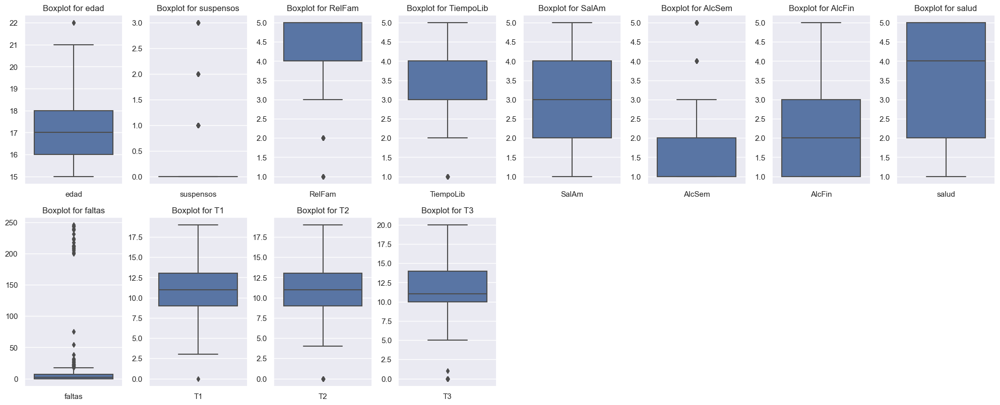

In [ ]:


print(len(numerical_vars+categorical_vars))

# Suspensos doesn't have values with 4 so i wont asign it more weight or anything like that

num_vars = len(df_train.columns)
cols_per_row = 8  
rows = math.ceil(num_vars / cols_per_row) 


fig, axes = plt.subplots(rows, cols_per_row, figsize=(20, rows * 4))  
axes = axes.flatten()  
for i, var in enumerate(numerical_vars):
    sns.boxplot(data=df_train[[var]], ax=axes[i])
    axes[i].set_title(f'Boxplot for {var}')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])  


plt.tight_layout()
plt.show()


array([[<Axes: title={'center': 'edad'}>,
        <Axes: title={'center': 'Medu'}>,
        <Axes: title={'center': 'Pedu'}>,
        <Axes: title={'center': 'TiempoViaje'}>],
       [<Axes: title={'center': 'TiempoEstudio'}>,
        <Axes: title={'center': 'suspensos'}>,
        <Axes: title={'center': 'RelFam'}>,
        <Axes: title={'center': 'TiempoLib'}>],
       [<Axes: title={'center': 'SalAm'}>,
        <Axes: title={'center': 'AlcSem'}>,
        <Axes: title={'center': 'AlcFin'}>,
        <Axes: title={'center': 'salud'}>],
       [<Axes: title={'center': 'faltas'}>,
        <Axes: title={'center': 'T1'}>, <Axes: title={'center': 'T2'}>,
        <Axes: title={'center': 'T3'}>]], dtype=object)

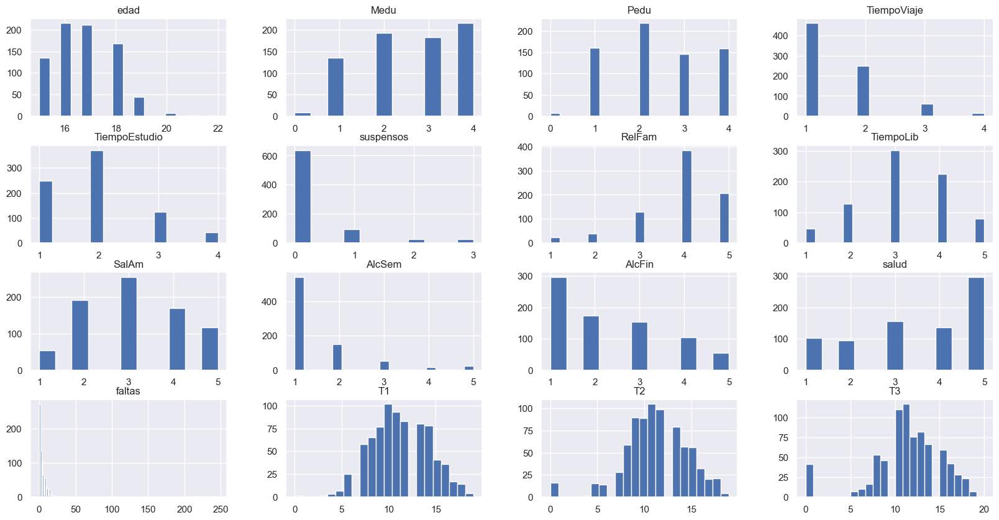

In [9]:

df_train.hist(bins='auto',figsize=(20,10))

After this first visualization of the numerical variables we can see some weird behaviour and outliers in *faltas* and *suspensos*. However, this two variables represent situations that aren't typicall so the outliers might be informative. However, the school year in Spain has 150 days, so it is impossible for students to have absences of more than 200, i will clip those values.


In [22]:
df_train['faltas'] = df_train['faltas'].clip(0,150)

## STEP 4: ENCODE CATEGORICAL VARIABLES

In this step I do one hot encoding on all the categorical variables.



In [ ]:

# encoder = OneHotEncoder(sparse_output=False)

# encoder = OneHotEncoder(sparse_output=False)
# # The test set doesn't have all the range of values in some variables, so we train the encoder on the training set
# encoder.fit(df_train[categorical_vars])

# # Train encoding
# one_hot_encoded_train = encoder.transform(df_train[categorical_vars])
# one_hot_df_train = pd.DataFrame(one_hot_encoded_train, 
#                                 columns=encoder.get_feature_names_out(categorical_vars), 
#                                 index=df_train.index)
# df_train_cat = pd.concat([df_train.drop(categorical_vars, axis=1), one_hot_df_train], axis=1)

# # Test encoding 
# one_hot_encoded_test = encoder.transform(df_test[categorical_vars])
# one_hot_df_test = pd.DataFrame(one_hot_encoded_test, 
#                                 columns=encoder.get_feature_names_out(categorical_vars), 
#                                 index=df_test.index)
# df_test_cat = pd.concat([df_test.drop(categorical_vars, axis=1), one_hot_df_test], axis=1)


In [ ]:
df_train_cat = pd.get_dummies(df_train,columns=categorical_vars,drop_first=True)
df_test_cat = pd.get_dummies(df_test,columns=categorical_vars,drop_first=True)

## STEP 5: Standardize the numerical variables

We will consider the scale 1-20 as our base scale. The only variable that exceed this scale is *faltas*, due to its outliers.

**Important:** We will transform the data using only the mean and std from the training set.

I will save this here just in case it's usefull, however, the scale is basically due to the outliers, so maybe it's better to deal with them sepparately.

In [11]:
# Manually
mu_faltas = df_train_cat['faltas'].mean()
std_faltas = df_train_cat['faltas'].std()

df_train_std_m = df_train_cat.copy()
df_test_std_m = df_test_cat.copy()

df_train_std_m['faltas']= (df_train_std_m['faltas'] - mu_faltas)/std_faltas
df_test_std_m['faltas']= (df_test_std_m['faltas'] - mu_faltas)/std_faltas

print(df_train_std_m['faltas'].min())
print(df_train_std_m['faltas'].max())

print(df_test_std_m['faltas'].min())
print(df_test_std_m['faltas'].max())

-0.28637058025563916
6.9332005971826876
-0.28637058025563916
0.8873669779889832


In [12]:
scaler = StandardScaler()

# Scale only numerical columns
X_train_scaled = pd.DataFrame(scaler.fit_transform(df_train_cat[numerical_vars]), columns=numerical_vars, index=df_train_cat.index)
X_test_scaled = pd.DataFrame(scaler.transform(df_test_cat[numerical_vars]), columns=numerical_vars, index=df_test_cat.index)

# Concatenate scaled numerical features with original categorical features
X_train_final = pd.concat([df_train_cat.drop(numerical_vars, axis=1), X_train_scaled], axis=1)
X_test_final = pd.concat([df_test_cat.drop(numerical_vars, axis=1), X_test_scaled], axis=1)

# Check the final DataFrame
print(X_train_final.head())
print(X_test_final.head())

   escuela_BG  escuela_IC  sexo_F  sexo_M  entorno_R  entorno_U  TamFam_<4  \
0         0.0         1.0     0.0     1.0        0.0        1.0        0.0   
1         1.0         0.0     1.0     0.0        0.0        1.0        0.0   
2         1.0         0.0     1.0     0.0        1.0        0.0        0.0   
3         1.0         0.0     1.0     0.0        0.0        1.0        1.0   
4         1.0         0.0     0.0     1.0        0.0        1.0        1.0   

   TamFam_>=4  EstPadres_J  EstPadres_S  ...    RelFam  TiempoLib     SalAm  \
0         1.0          1.0          0.0  ...  0.100473   0.772719 -0.118131   
1         1.0          1.0          0.0  ... -2.002755   0.772719  0.756707   
2         1.0          1.0          0.0  ... -2.002755   0.772719  0.756707   
3         0.0          1.0          0.0  ...  1.152087   0.772719 -0.118131   
4         0.0          1.0          0.0  ... -0.951141  -1.168351  0.756707   

     AlcSem    AlcFin     salud    faltas        T1     

## STEP 6: EXPLORATORY ANALYSIS

After plotting all the variables against eachother we can see there is a clear linear relationship between T1, T2 and T3, which will be useful for our Model1




In [13]:
# Don't plot this unless you have time. The results are in the photo

#sns.pairplot(df_train_cat, hue='T3', palette="viridis")

In [14]:
# plt.matshow(df_train_cat.corr())
# plt.colorbar()
# plt.show()

## STEP 7: CHECK OUT FOR CLASS IMBALANCES


In general the classes are very imbalanced, however, this is due to demographic factors, which are informative. The most imbalanced class in the training set is EstSup, (717-68), but for now 68 points should be enough to correctly represent the variable.

In [15]:

for var in categorical_vars:
    percentage = df_train_cat[var].value_counts()[0]/df_train_cat[var].value_counts().sum()
    if percentage > 0.85 or percentage < 0.15:
        print(f'Very imbalanced class: {var} Class 1: {percentage*100} % Class 2: {(1-percentage)*100}')


KeyError: 'escuela'

### Import the processed data

In [ ]:

df_train.to_csv("data/train.csv", sep = ",", index = False)
df_test.to_csv("data/test.csv", sep = ",", index = False)
